In [28]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from os import chdir
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, roc_curve, precision_recall_curve, classification_report, ConfusionMatrixDisplay, auc

from sklearn.metrics import accuracy_score, roc_curve, precision_recall_curve

In [2]:
# Read data and drop redundant column.
import os 
chdir(os.getcwd())
data = pd.read_csv('match_history.csv')
data.head()



,date,home_team,away_team,home_team_continent,away_team_continent,home_team_fifa_rank,away_team_fifa_rank,home_team_total_fifa_points,away_team_total_fifa_points,home_team_score,...,shoot_out,home_team_result,home_team_goalkeeper_score,away_team_goalkeeper_score,home_team_mean_defense_score,home_team_mean_offense_score,home_team_mean_midfield_score,away_team_mean_defense_score,away_team_mean_offense_score,away_team_mean_midfield_score
0,2004-09-03,Spain,Scotland,Europe,Europe,3,67,0,0,1,...,No,Draw,94.0,84.0,86.5,89.3,89.5,80.2,79.7,81.8
1,2004-09-04,Albania,Greece,Europe,Europe,94,14,0,0,2,...,No,Win,NaN,90.0,NaN,59.0,74.5,82.8,83.7,85.2
2,2004-09-04,Austria,England,Europe,Europe,90,7,0,0,2,...,No,Draw,83.0,88.0,76.2,73.0,74.0,90.5,88.7,91.2
3,2004-09-04,Croatia,Hungary,Europe,Europe,25,76,0,0,3,...,No,Win,77.0,74.0,80.5,78.7,79.0,71.8,75.7,70.2
4,2004-09-04,Denmark,Ukraine,Europe,Europe,15,87,0,0,1,...,No,Draw,82.0,NaN,79.5,85.0,81.5,NaN,81.7,65.8


In [3]:
#what is the win rate for the home team?

# Total number of matches.
n_matches = data.shape[0]

# Calculate number of features. -1 because we are saving one as the target variable (win/lose/draw)
n_features = data.shape[1] - 1

# Calculate matches won by home team.
n_homewins = len(data[data.home_team_result == 'Win'])

# Calculate win rate for home team.
win_rate = (float(n_homewins) / (n_matches)) * 100
# Print the results
print ("Total number of matches", n_matches)
print ("Number of features", n_features)
print ("Number of matches won by home team", n_homewins)
print ("Win rate of home team: {:.2f} %".format(win_rate))


Total number of matches 5641
Number of features 24
Number of matches won by home team 2605
Win rate of home team: 46.18 %


In [4]:
#cheching for null values
data.isna().sum()



date                               0
home_team                          0
away_team                          0
home_team_continent                0
away_team_continent                0
home_team_fifa_rank                0
away_team_fifa_rank                0
home_team_total_fifa_points        0
away_team_total_fifa_points        0
home_team_score                    0
away_team_score                    0
tournament                         0
city                               0
country                            0
neutral_location                   0
shoot_out                          0
home_team_result                   0
home_team_goalkeeper_score       327
away_team_goalkeeper_score       400
home_team_mean_defense_score     325
home_team_mean_offense_score     151
home_team_mean_midfield_score    223
away_team_mean_defense_score     376
away_team_mean_offense_score     182
away_team_mean_midfield_score    259
dtype: int64

In [5]:
#data type
data.dtypes

#object type data need to be turned to strings

date                              object
home_team                         object
away_team                         object
home_team_continent               object
away_team_continent               object
home_team_fifa_rank                int64
away_team_fifa_rank                int64
home_team_total_fifa_points        int64
away_team_total_fifa_points        int64
home_team_score                    int64
away_team_score                    int64
tournament                        object
city                              object
country                           object
neutral_location                    bool
shoot_out                         object
home_team_result                  object
home_team_goalkeeper_score       float64
away_team_goalkeeper_score       float64
home_team_mean_defense_score     float64
home_team_mean_offense_score     float64
home_team_mean_midfield_score    float64
away_team_mean_defense_score     float64
away_team_mean_offense_score     float64
away_team_mean_m

In [6]:
strings =['date', 'home_team','away_team','home_team_continent', 'away_team_continent',
       'tournament', 'city' , 'country', 'neutral_location', 'shoot_out', 'home_team_result']
num = ['home_team_fifa_rank', 'away_team_fifa_rank', 'home_team_total_fifa_points', 'away_team_total_fifa_points', 
       'home_team_score', 'away_team_score', 'home_team_goalkeeper_score', 
       'away_team_goalkeeper_score', 'home_team_mean_defense_score', 'home_team_mean_offense_score', 
       'home_team_mean_midfield_score', 'away_team_mean_defense_score', 'away_team_mean_offense_score',
       'away_team_mean_midfield_score']
for s in strings:
    data[s] = data[s].astype(str)
    
for n in num:
    
    data[n] = data[n].astype(float)
data.head()

,date,home_team,away_team,home_team_continent,away_team_continent,home_team_fifa_rank,away_team_fifa_rank,home_team_total_fifa_points,away_team_total_fifa_points,home_team_score,...,shoot_out,home_team_result,home_team_goalkeeper_score,away_team_goalkeeper_score,home_team_mean_defense_score,home_team_mean_offense_score,home_team_mean_midfield_score,away_team_mean_defense_score,away_team_mean_offense_score,away_team_mean_midfield_score
0,2004-09-03,Spain,Scotland,Europe,Europe,3.0,67.0,0.0,0.0,1.0,...,No,Draw,94.0,84.0,86.5,89.3,89.5,80.2,79.7,81.8
1,2004-09-04,Albania,Greece,Europe,Europe,94.0,14.0,0.0,0.0,2.0,...,No,Win,NaN,90.0,NaN,59.0,74.5,82.8,83.7,85.2
2,2004-09-04,Austria,England,Europe,Europe,90.0,7.0,0.0,0.0,2.0,...,No,Draw,83.0,88.0,76.2,73.0,74.0,90.5,88.7,91.2
3,2004-09-04,Croatia,Hungary,Europe,Europe,25.0,76.0,0.0,0.0,3.0,...,No,Win,77.0,74.0,80.5,78.7,79.0,71.8,75.7,70.2
4,2004-09-04,Denmark,Ukraine,Europe,Europe,15.0,87.0,0.0,0.0,1.0,...,No,Draw,82.0,NaN,79.5,85.0,81.5,NaN,81.7,65.8


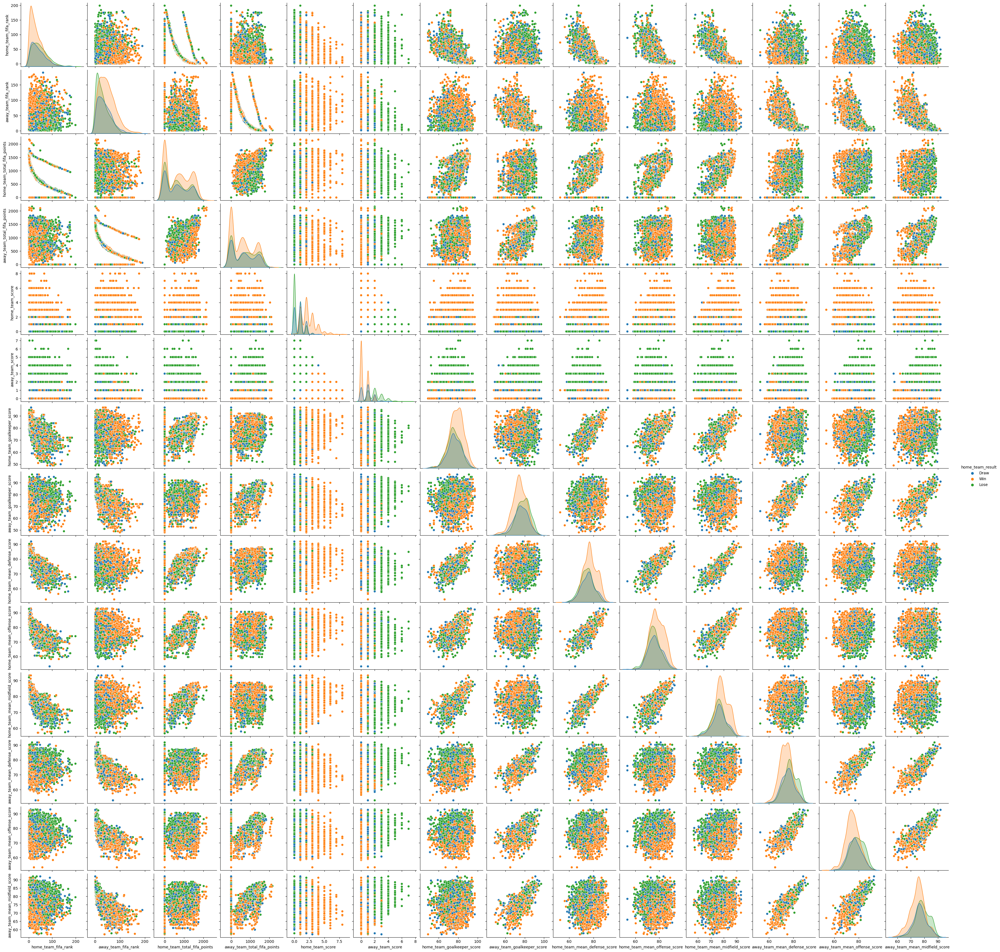

In [7]:
g = sns.pairplot(data[['home_team_fifa_rank', 'away_team_fifa_rank', 'home_team_total_fifa_points', 'away_team_total_fifa_points', 
       'home_team_score', 'away_team_score', 'home_team_goalkeeper_score', 
       'away_team_goalkeeper_score', 'home_team_mean_defense_score', 'home_team_mean_offense_score', 
       'home_team_mean_midfield_score', 'away_team_mean_defense_score', 'away_team_mean_offense_score',
       'away_team_mean_midfield_score', 'home_team_result']], hue = 'home_team_result')

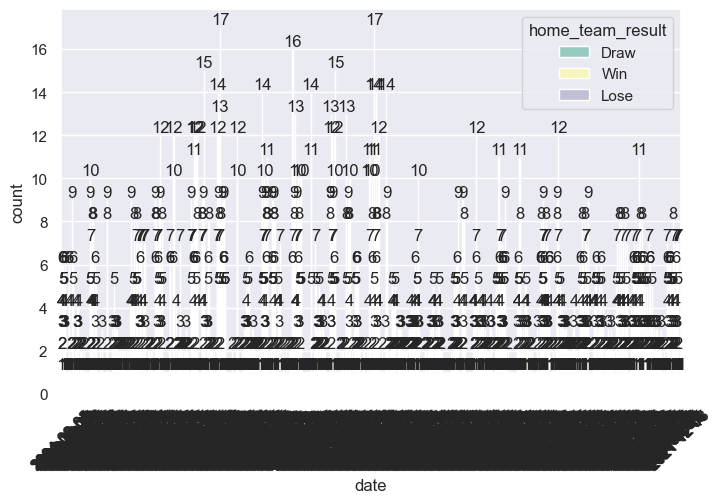

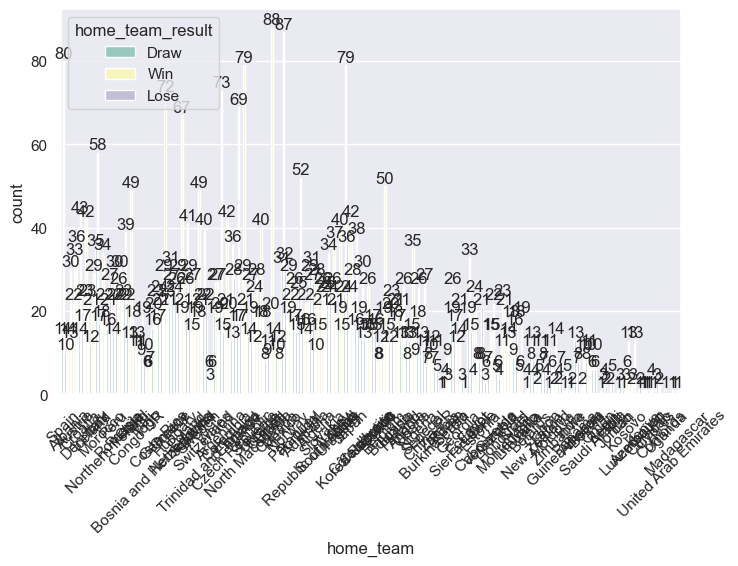

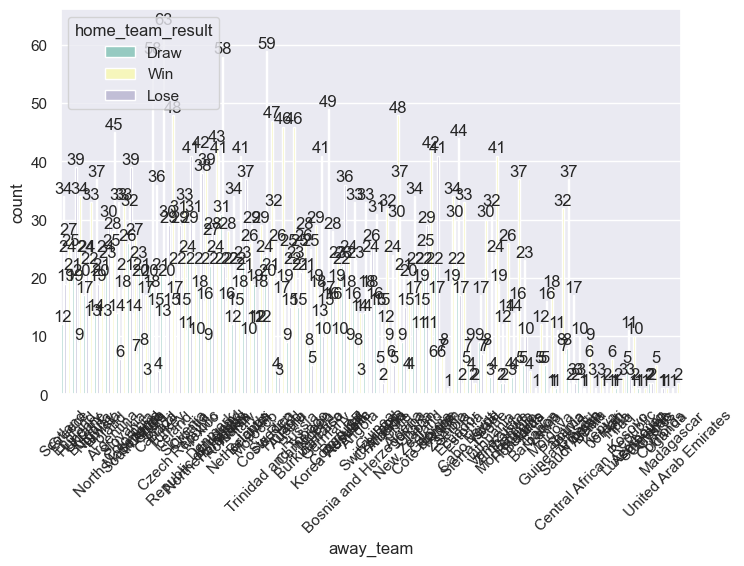

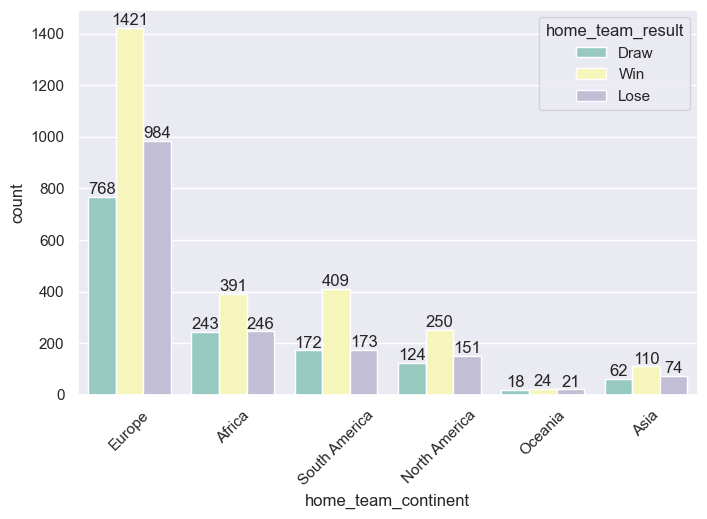

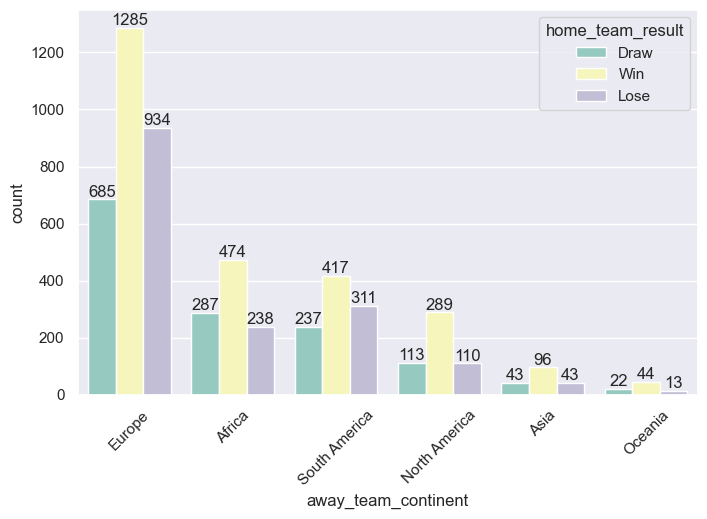

...

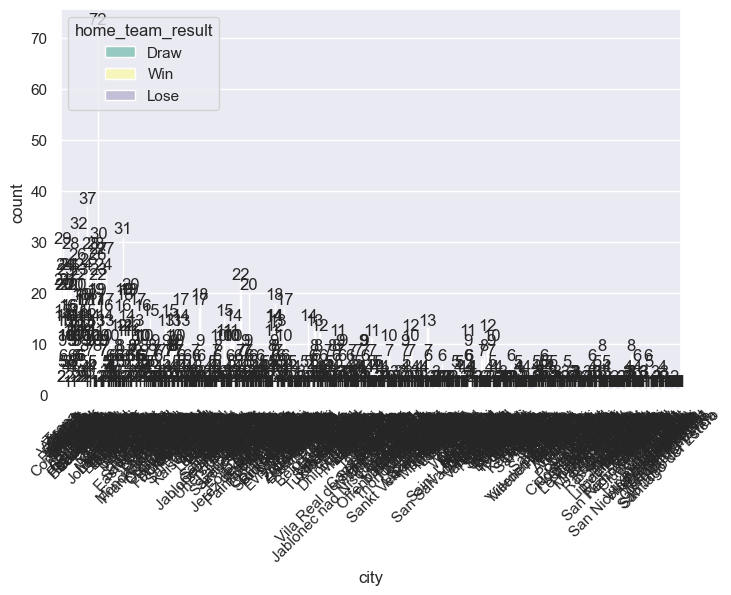

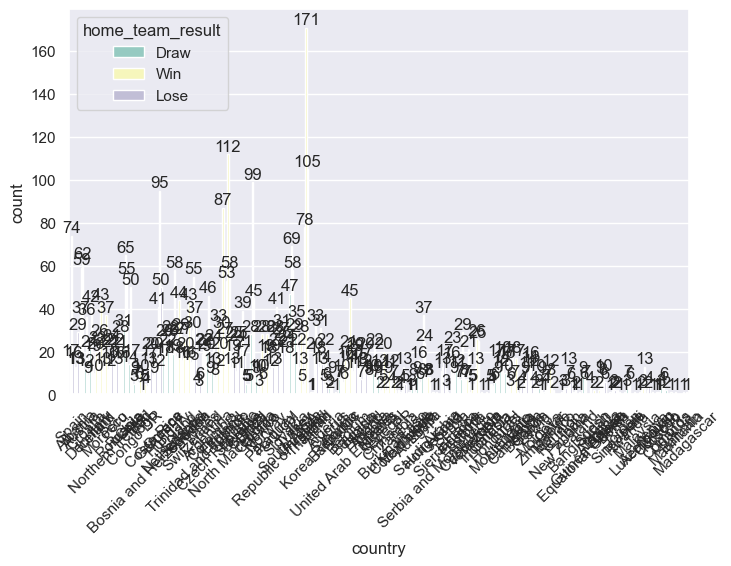

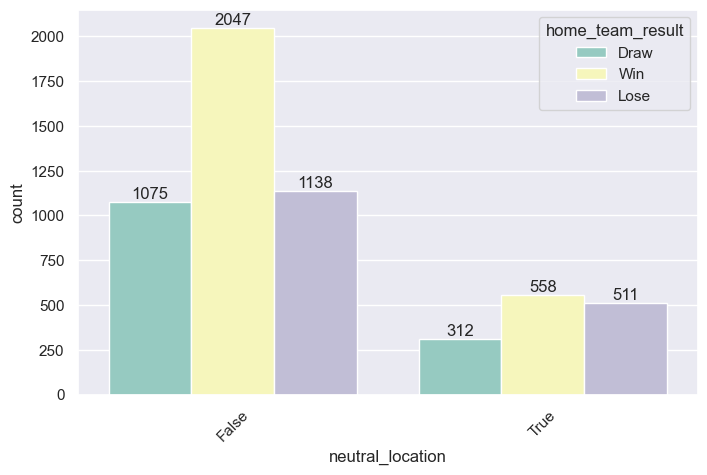

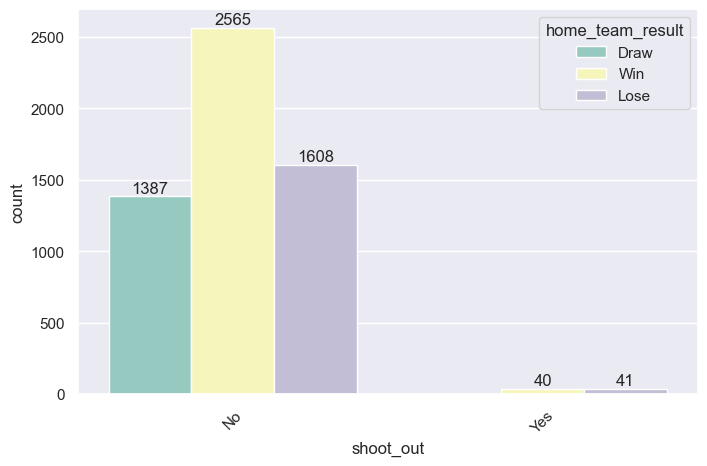

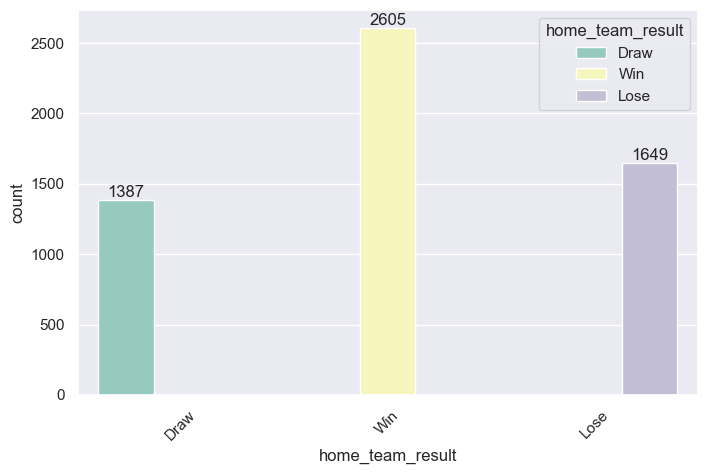

In [8]:
categories = ['date', 'home_team','away_team','home_team_continent', 'away_team_continent',
       'tournament', 'city' , 'country', 'neutral_location', 'shoot_out', 'home_team_result']

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(8,5)})

for f in categories:
    ax = sns.countplot(x = f, data = data, palette = 'Set3', hue = 'home_team_result')
    for container in ax.containers:
        ax.bar_label(container)
    plt.xticks(rotation=45)
    plt.show()

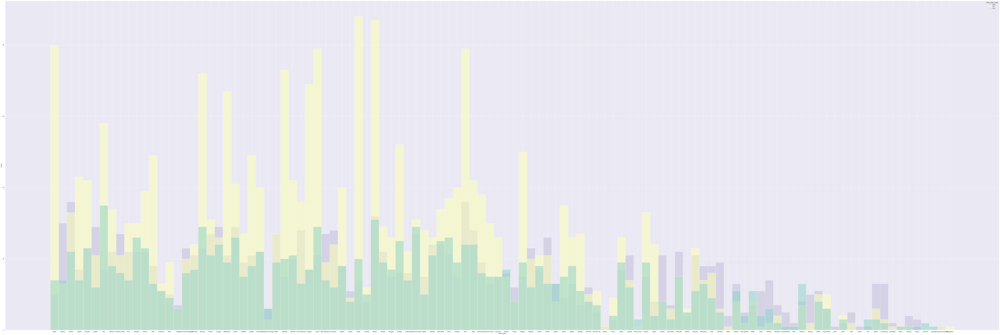

In [9]:
sns.set(rc={'figure.figsize':(150,50)})

home_team_data = data.copy()

home_team_data = home_team_data[~home_team_data['home_team'].isna()]

ax = sns.histplot(x = 'home_team', data = home_team_data, palette = 'Set3', hue = 'home_team_result', binwidth=20)

In [10]:
# changing missing values to mode and median

strings2 =['date', 'home_team','away_team','home_team_continent', 'away_team_continent',
       'tournament', 'city' , 'country', 'neutral_location', 'shoot_out', 'home_team_result']
num2 = ['home_team_fifa_rank', 'away_team_fifa_rank', 'home_team_total_fifa_points', 'away_team_total_fifa_points', 
       'home_team_score', 'away_team_score', 'home_team_goalkeeper_score', 
       'away_team_goalkeeper_score', 'home_team_mean_defense_score', 'home_team_mean_offense_score', 
       'home_team_mean_midfield_score', 'away_team_mean_defense_score', 'away_team_mean_offense_score',
       'away_team_mean_midfield_score']

for s in strings2:
    mode = data[s].mode()[0]
    data[s]= data[s].fillna(mode)
   # raw_data_clean[s][raw_data_clean[s] == 'nan'] = mode
    
for n in num2:
    median = data[n].median()
    data[n]= data[n].fillna(median)
    # checking for nulls
data.isna().sum()


date                             0
home_team                        0
away_team                        0
home_team_continent              0
away_team_continent              0
home_team_fifa_rank              0
away_team_fifa_rank              0
home_team_total_fifa_points      0
away_team_total_fifa_points      0
home_team_score                  0
away_team_score                  0
tournament                       0
city                             0
country                          0
neutral_location                 0
shoot_out                        0
home_team_result                 0
home_team_goalkeeper_score       0
away_team_goalkeeper_score       0
home_team_mean_defense_score     0
home_team_mean_offense_score     0
home_team_mean_midfield_score    0
away_team_mean_defense_score     0
away_team_mean_offense_score     0
away_team_mean_midfield_score    0
dtype: int64

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


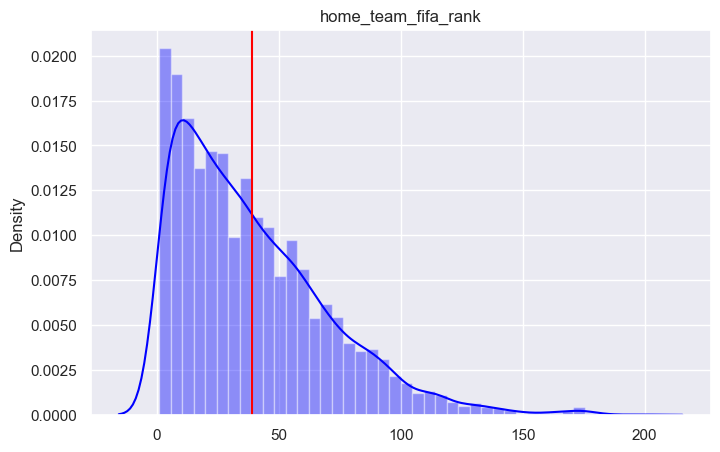

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


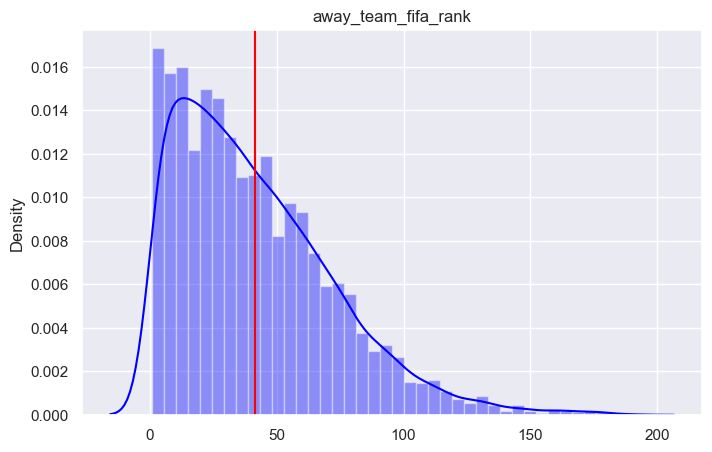

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


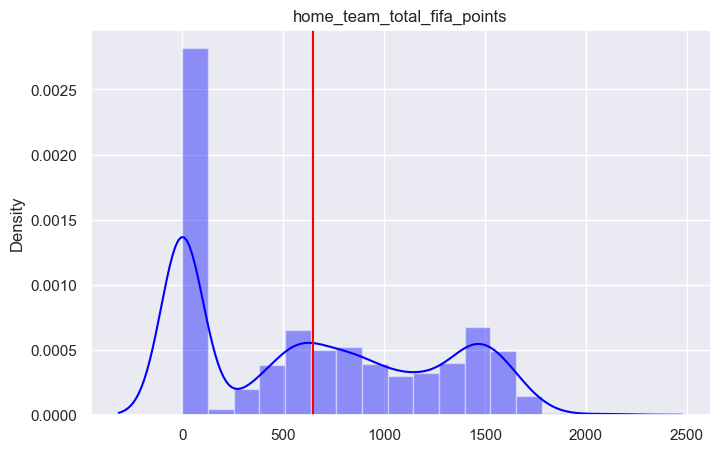

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


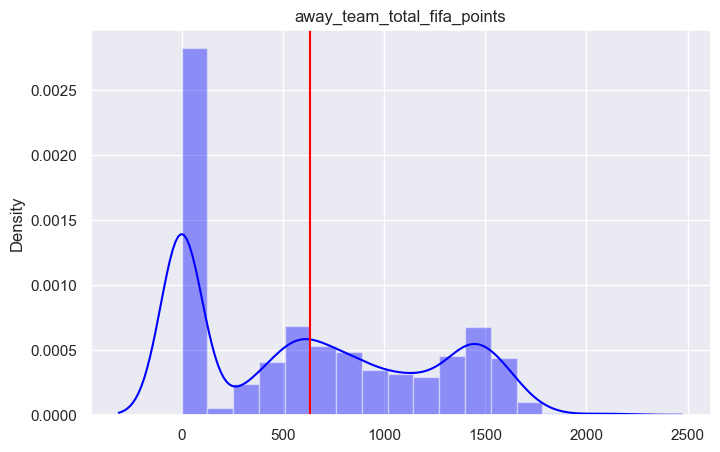

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


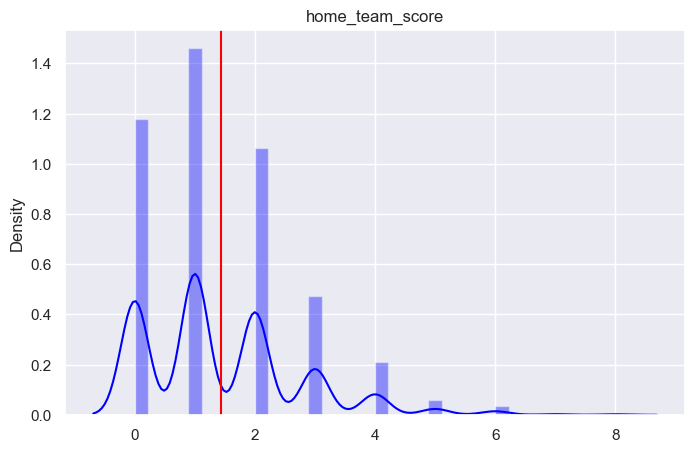

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


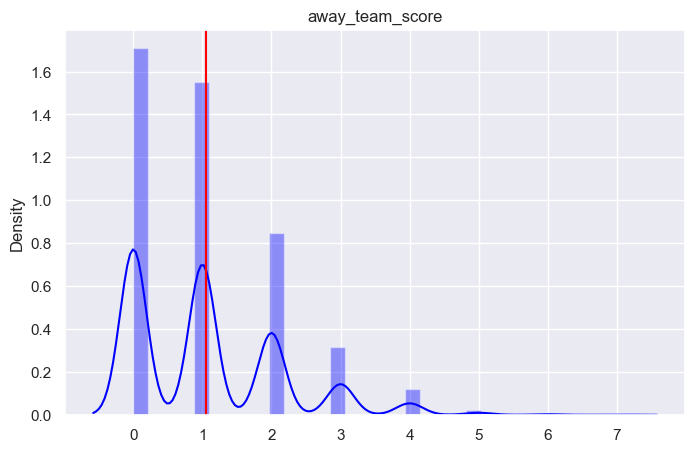

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


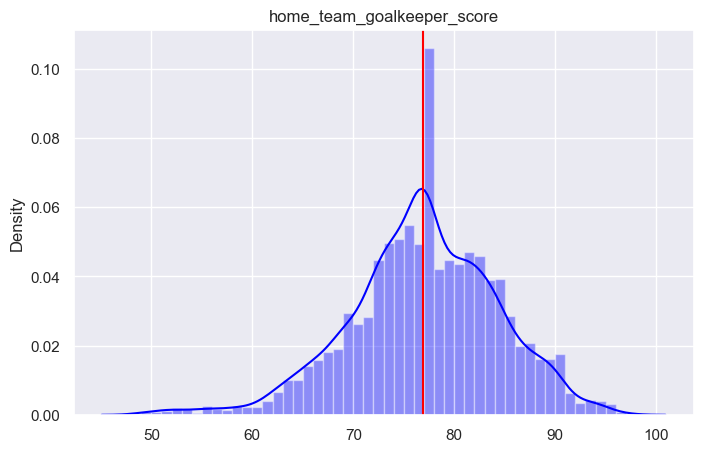

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


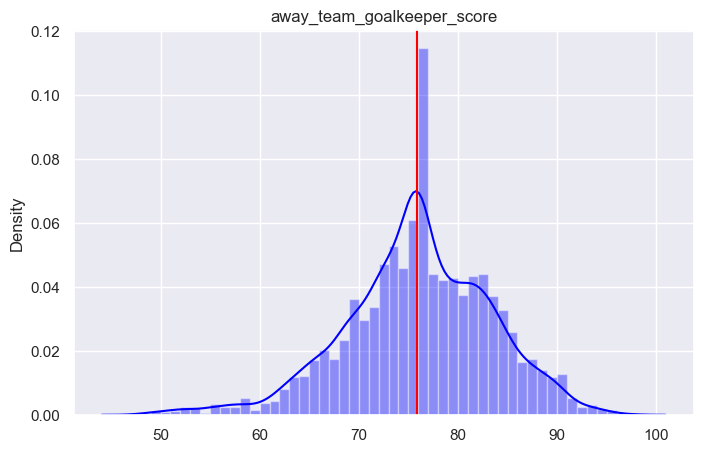

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


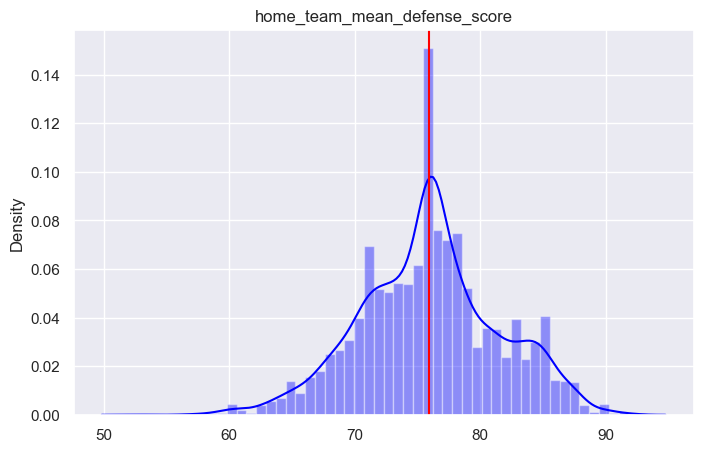

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


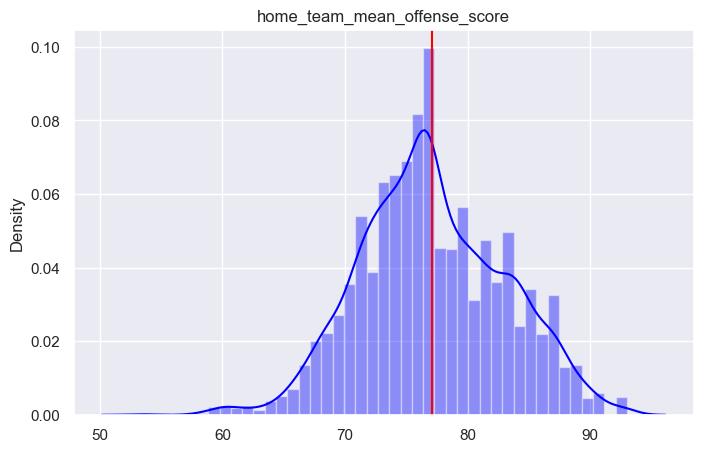

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


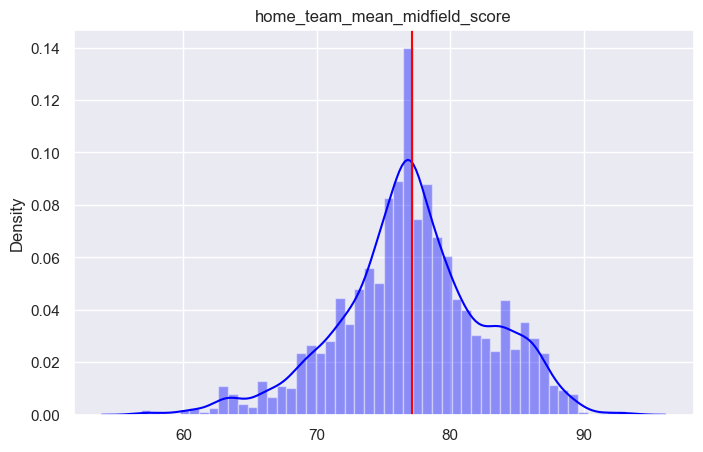

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


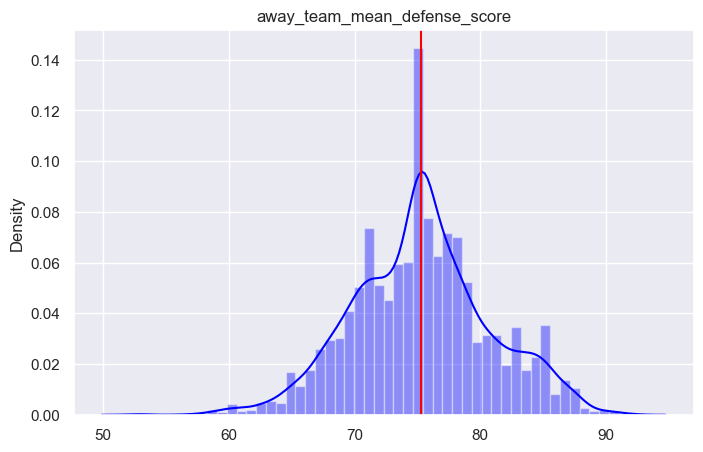

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


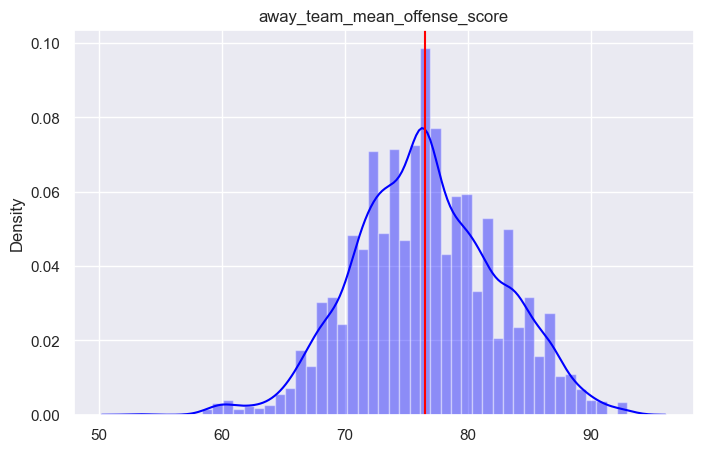

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


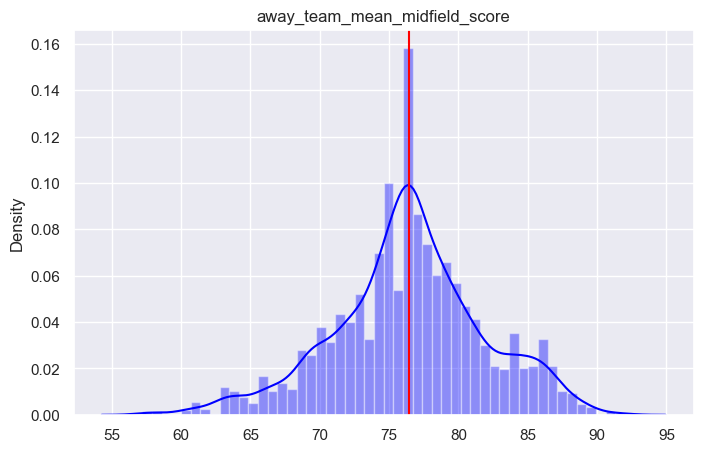

In [11]:
#Investigating distributions
sns.set(rc={'figure.figsize':(8,5)})


for n in num2:
    x = data[n].values
    sns.distplot(x, color = 'blue');

    # Calculating the mean
    mean = data[n].mean()

    #ploting the mean
    plt.axvline(mean, 0,1, color = 'red')
    plt.title(n)
    plt.show()

home_team_fifa_rank
The meadian is:  32.0


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


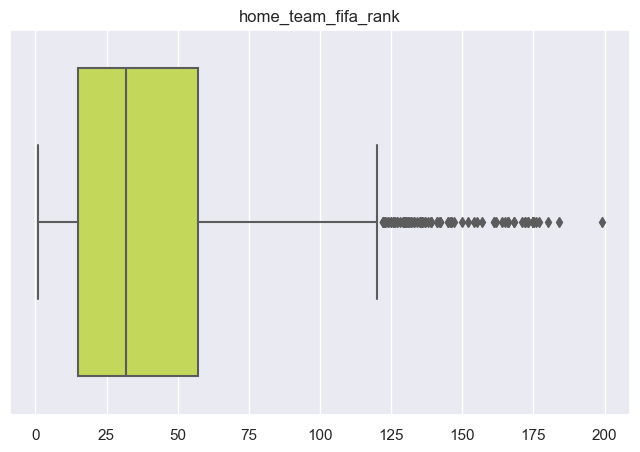

away_team_fifa_rank
The meadian is:  36.0


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


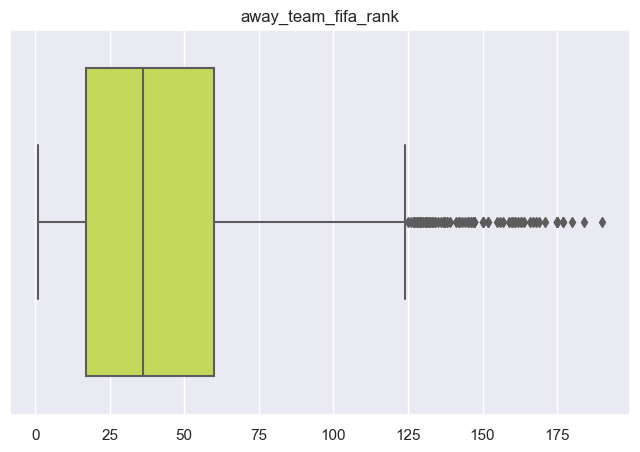

home_team_total_fifa_points
The meadian is:  606.0


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


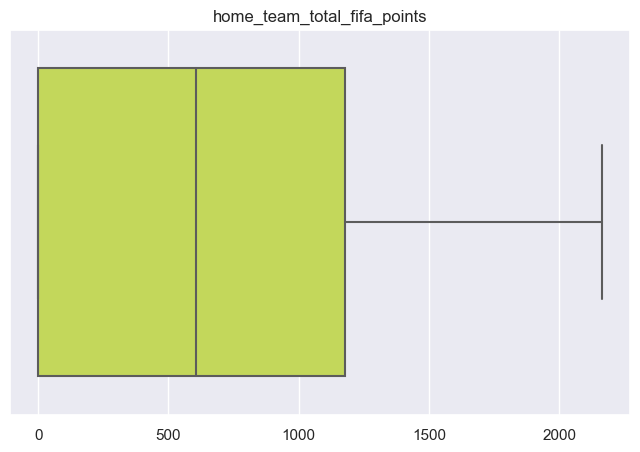

away_team_total_fifa_points
The meadian is:  587.0


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


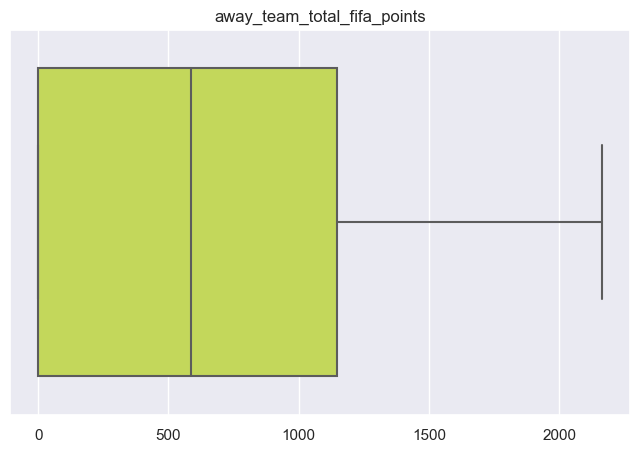

home_team_score
The meadian is:  1.0


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


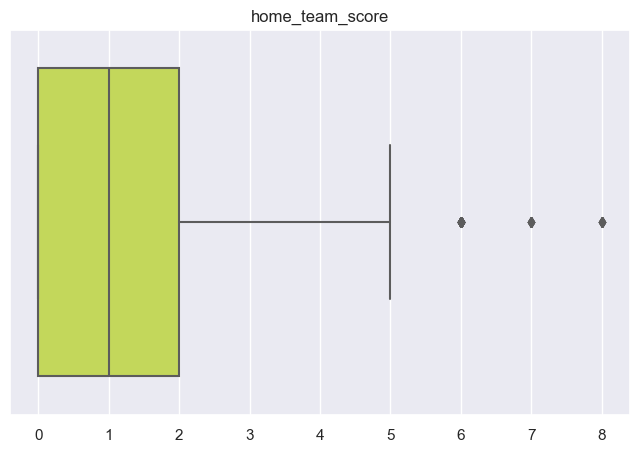

away_team_score
The meadian is:  1.0


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


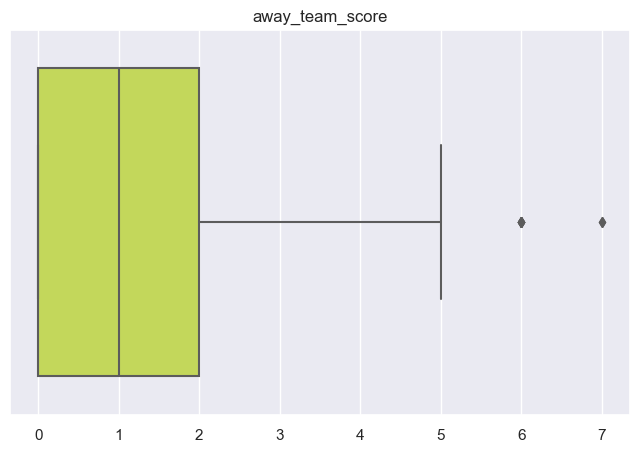

home_team_goalkeeper_score
The meadian is:  77.0


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


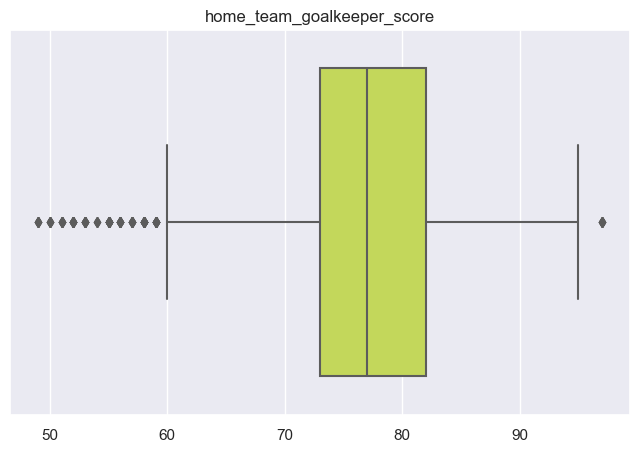

away_team_goalkeeper_score
The meadian is:  76.0


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


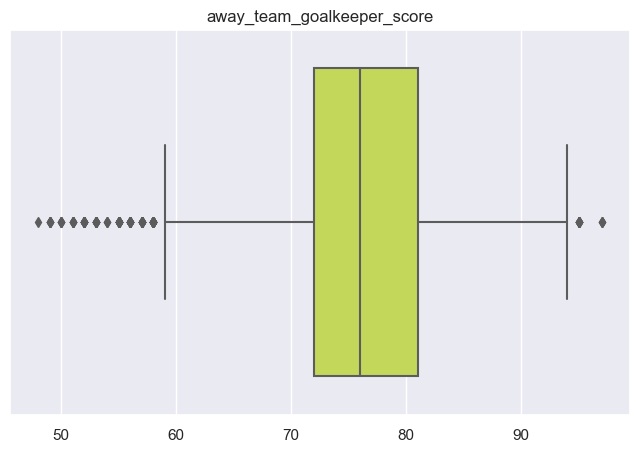

home_team_mean_defense_score
The meadian is:  76.0


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


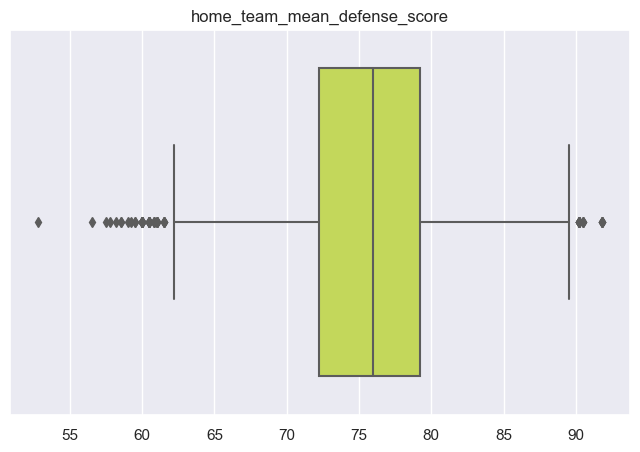

home_team_mean_offense_score
The meadian is:  76.7


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


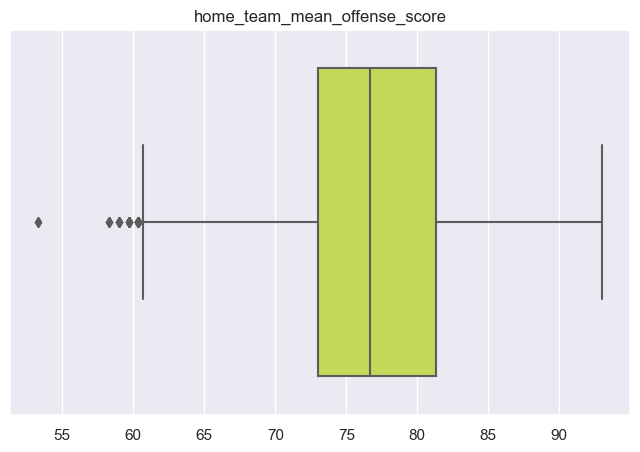

home_team_mean_midfield_score
The meadian is:  77.0


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


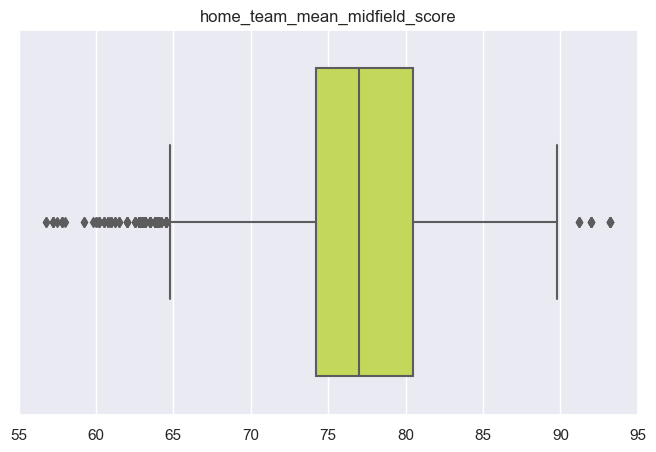

away_team_mean_defense_score
The meadian is:  75.2


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


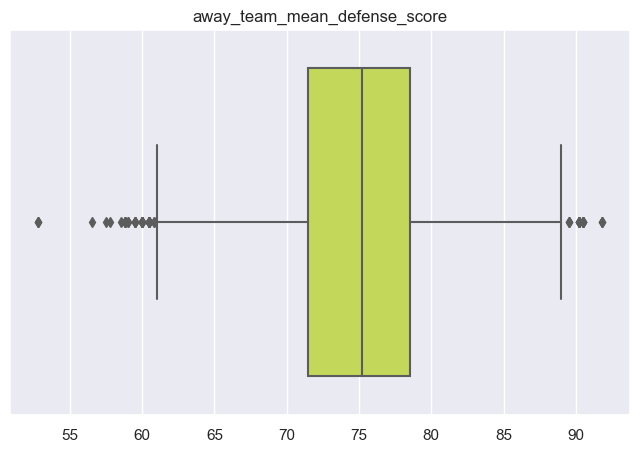

away_team_mean_offense_score
The meadian is:  76.3


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


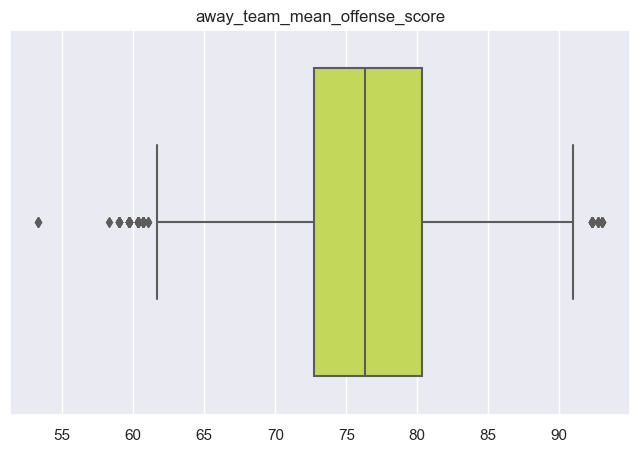

away_team_mean_midfield_score
The meadian is:  76.5


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


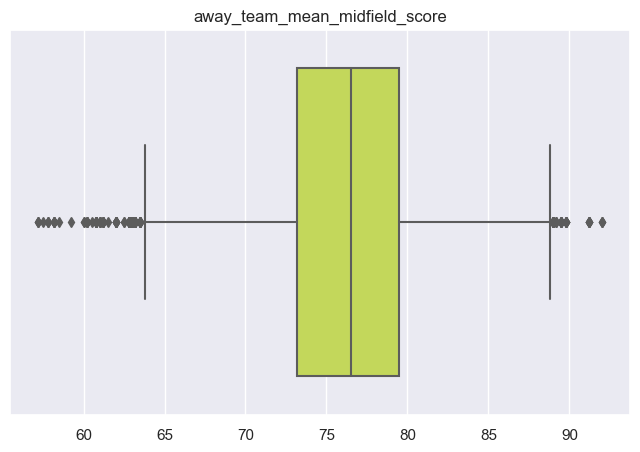

In [12]:
sns.set(rc={'figure.figsize':(8,5)})

for c in num2:
    print(c)
    x = data[c].values
    ax = sns.boxplot(x, color = '#D1EC46')
    print('The meadian is: ', data[c].median())
    plt.title(c)
    plt.show()

In [13]:
#we do not want to delete the "outliers" - we will deal with this by scaling the data
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

data[['home_team_fifa_rank','away_team_fifa_rank','home_team_score', 'away_team_score', 'home_team_goalkeeper_score', 
       'away_team_goalkeeper_score', 'home_team_mean_defense_score', 'home_team_mean_offense_score', 
       'home_team_mean_midfield_score', 'away_team_mean_defense_score', 'away_team_mean_offense_score',
       'away_team_mean_midfield_score']] = scaler.fit_transform(data[['home_team_fifa_rank','away_team_fifa_rank','home_team_score', 'away_team_score', 'home_team_goalkeeper_score', 
       'away_team_goalkeeper_score', 'home_team_mean_defense_score', 'home_team_mean_offense_score', 
       'home_team_mean_midfield_score', 'away_team_mean_defense_score', 'away_team_mean_offense_score',
       'away_team_mean_midfield_score']])
data.head()

,date,home_team,away_team,home_team_continent,away_team_continent,home_team_fifa_rank,away_team_fifa_rank,home_team_total_fifa_points,away_team_total_fifa_points,home_team_score,...,shoot_out,home_team_result,home_team_goalkeeper_score,away_team_goalkeeper_score,home_team_mean_defense_score,home_team_mean_offense_score,home_team_mean_midfield_score,away_team_mean_defense_score,away_team_mean_offense_score,away_team_mean_midfield_score
0,2004-09-03,Spain,Scotland,Europe,Europe,0.010101,0.349206,0.0,0.0,0.125,...,No,Draw,0.937500,0.734694,0.864103,0.906801,0.898352,0.702564,0.664987,0.706897
1,2004-09-04,Albania,Greece,Europe,Europe,0.469697,0.068783,0.0,0.0,0.250,...,No,Win,0.583333,0.857143,0.594872,0.143577,0.486264,0.769231,0.765743,0.804598
2,2004-09-04,Austria,England,Europe,Europe,0.449495,0.031746,0.0,0.0,0.250,...,No,Draw,0.708333,0.816327,0.600000,0.496222,0.472527,0.966667,0.891688,0.977011
3,2004-09-04,Croatia,Hungary,Europe,Europe,0.121212,0.396825,0.0,0.0,0.375,...,No,Win,0.583333,0.530612,0.710256,0.639798,0.609890,0.487179,0.564232,0.373563
4,2004-09-04,Denmark,Ukraine,Europe,Europe,0.070707,0.455026,0.0,0.0,0.125,...,No,Draw,0.687500,0.571429,0.684615,0.798489,0.678571,0.574359,0.715365,0.247126


In [14]:
# turning text into numeric representation

new_data = pd.get_dummies(data, columns = ['home_team','away_team','home_team_continent', 'away_team_continent',
                                           'tournament', 'city' , 'country', 'neutral_location', 'shoot_out'])
new_data.head()

,date,home_team_fifa_rank,away_team_fifa_rank,home_team_total_fifa_points,away_team_total_fifa_points,home_team_score,away_team_score,home_team_result,home_team_goalkeeper_score,away_team_goalkeeper_score,...,country_Uruguay,country_Venezuela,country_Vietnam,country_Wales,country_Zambia,country_Zimbabwe,neutral_location_False,neutral_location_True,shoot_out_No,shoot_out_Yes
0,2004-09-03,0.010101,0.349206,0.0,0.0,0.125,0.142857,Draw,0.937500,0.734694,...,0,0,0,0,0,0,1,0,1,0
1,2004-09-04,0.469697,0.068783,0.0,0.0,0.250,0.142857,Win,0.583333,0.857143,...,0,0,0,0,0,0,1,0,1,0
2,2004-09-04,0.449495,0.031746,0.0,0.0,0.250,0.285714,Draw,0.708333,0.816327,...,0,0,0,0,0,0,1,0,1,0
3,2004-09-04,0.121212,0.396825,0.0,0.0,0.375,0.000000,Win,0.583333,0.530612,...,0,0,0,0,0,0,1,0,1,0
4,2004-09-04,0.070707,0.455026,0.0,0.0,0.125,0.142857,Draw,0.687500,0.571429,...,0,0,0,0,0,0,1,0,1,0


In [15]:
#Selecting the important features
new_data.columns

Index(['date', 'home_team_fifa_rank', 'away_team_fifa_rank',
       'home_team_total_fifa_points', 'away_team_total_fifa_points',
       'home_team_score', 'away_team_score', 'home_team_result',
       'home_team_goalkeeper_score', 'away_team_goalkeeper_score',
       ...
       'country_Uruguay', 'country_Venezuela', 'country_Vietnam',
       'country_Wales', 'country_Zambia', 'country_Zimbabwe',
       'neutral_location_False', 'neutral_location_True', 'shoot_out_No',
       'shoot_out_Yes'],
      dtype='object', length=1177)

In [19]:
from sklearn.tree import DecisionTreeClassifier

# deleting for rerun
try:
    del final_fi
except:
    print("")

# Split the data into X & y

X = new_data.drop(['home_team_result','date'], axis = 1).values
X_columns = new_data.drop(['home_team_result','date'], axis = 1)
y = new_data['home_team_result']

print(X.shape)
print(y.shape)

# Run a Tree-based estimators (i.e. decision trees & random forests)
dt = DecisionTreeClassifier(random_state=15, criterion  = 'entropy', max_depth = 10)
dt.fit(X,y)
# Calculating FI
for i, column in enumerate(new_data.drop(['home_team_result','date'], axis=1)):
    print('Importance of feature {}:, {:.3f}'.format(column, dt.feature_importances_[i]))
    
    fi = pd.DataFrame({'Variable': [column], 'Feature Importance Score': [dt.feature_importances_[i]]})
    
    try:
        final_fi = pd.concat([final_fi,fi], ignore_index = True)
    except:
        final_fi = fi
        
        
# Ordering the data

final_fi = final_fi.sort_values('Feature Importance Score', ascending = False).reset_index()            
final_fi



(5641, 1175)
(5641,)
Importance of feature home_team_fifa_rank:, 0.001
Importance of feature away_team_fifa_rank:, 0.001
Importance of feature home_team_total_fifa_points:, 0.001
Importance of feature away_team_total_fifa_points:, 0.000
Importance of feature home_team_score:, 0.409
Importance of feature away_team_score:, 0.530
Importance of feature home_team_goalkeeper_score:, 0.000
Importance of feature away_team_goalkeeper_score:, 0.001
Importance of feature home_team_mean_defense_score:, 0.000
Importance of feature home_team_mean_offense_score:, 0.000
Importance of feature home_team_mean_midfield_score:, 0.000
Importance of feature away_team_mean_defense_score:, 0.000
Importance of feature away_team_mean_offense_score:, 0.001
Importance of feature away_team_mean_midfield_score:, 0.000
Importance of feature home_team_Albania:, 0.000
Importance of feature home_team_Algeria:, 0.000
Importance of feature home_team_Angola:, 0.000
Importance of feature home_team_Argentina:, 0.000
Importa

,index,Variable,Feature Importance Score
0,5,away_team_score,0.530083
1,4,home_team_score,0.409271
2,1174,shoot_out_Yes,0.032062
3,1173,shoot_out_No,0.020464
4,0,home_team_fifa_rank,0.001059
...,...,...,...
1170,399,city_Busan,0.000000
1171,398,city_Bursa,0.000000
1172,397,city_Burnaby,0.000000
1173,396,city_Burkina Faso,0.000000


In [ ]:
# compute correlations between features
corr = data.corr(method ='pearson')

from seaborn import heatmap
heatmap(corr)
ax2= sns.heatmap(corr, annot=True,
                 annot_kws={'size':5},
                 cmap="Blues")
plt.show()

In [20]:
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=0.2, random_state=18)

In [30]:
lr = LogisticRegression(solver='liblinear')
lr.fit(X_train, y_train)
y_lr = lr.predict(X_test)


In [22]:
nb = GaussianNB()
nb.fit(X_train, y_train)
y_nb = nb.predict(X_test)

In [23]:
lda = LDA()
lda.fit(X_train, y_train)
y_lda = lda.predict(X_test)

In [24]:
qda = QDA()
qda.fit(X_train, y_train)
y_qda = qda.predict(X_test)

C:\Users\User\anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:878: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


In [25]:
results = dict(zip(['logistic regression', 'naive bayes', 'LDA', 
               'QDA'],
              [y_lr, y_nb, y_lda, y_qda]))

# create a dictionary variable with keys being algorithm names and values being classification accuracy
accuracy = {}
for algorithm, prediction in results.items():
    accuracy[algorithm] = accuracy_score(y_test, prediction)
    
accuracy = pd.DataFrame(data=accuracy, index=[0])
accuracy

,logistic regression,naive bayes,LDA,QDA
0,0.869796,0.392383,0.806909,0.517272
